In [17]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [18]:
import pandas as pd
import os
import re
from ast import literal_eval
import numpy as np

pd.set_option('display.max_rows', 250)
pd.set_option('display.max_colwidth', 500)

In [19]:
from heuristics.model.utils import plot_imgs_with_labels, load_images
from heuristics.heuristics import catalog_flag, calculate_text_heuristics

In [20]:
HEUR_IMG_DIR = 'data/heuristics_images/'

In [21]:
dress_room_df = pd.read_csv('heuristics/data/heuristics_dressing_cabinet.csv')

In [22]:
dress_room_df.columns

Index(['image_id_ext', 'item_id_ext', 'microcat_name', 'title', 'description',
       'crop_coords', 'crop_area', 'is_catalog', 'n_texts', 'person_found',
       'perform_top_microcat_value', 'perform_top_microcat_name',
       'perform_top_microcat_prob', 'perform_top_other_classes_value',
       'perform_top_other_classes_prob', 'image'],
      dtype='object')

### Основные поля
'image_id_ext' - id изображения,

'item_id_ext' - id объявления к которому относится изображение,

'title' - заголовок объявления,

'description' - описание объявления,

'microcat_name' - категория объявления,

'image' - сслыка на изображение

### Выходы модели Smart-crop
'crop_coords' - координаты кропа,

'crop_area' - площадь кропа,

'is_catalog' - является ли изображение каталожным,

### Выход модели text_detector
'n_texts' - кол-во областей с текстом на изображении,

### Выход модели по поиску лиц
'person_found' - есть ли человек на изображении

### Выход модели Perform
'perform_top_microcat_value' - предсказание id микрокатегории изображения в виде

'perform_top_microcat_name' - соответствующее название микрокатегории

'perform_top_microcat_prob' - вероятность предсказанной микрокатегории

'perform_top_other_classes_value' - предсказание на другую группу классов

'perform_top_other_classes_prob' - вероятность предсказания

In [23]:
dress_room_df.head(2)[['microcat_name', 'image', 'title', 'description']]

,microcat_name,image,title,description
0,Гардеробные системы и вешалки,http://labelimages.avito.ru/15560973305.jpg,Система хранения,"Система хранения в Санкт-Петербурге и Лен.области с гарантией от завода 10 лет,🚀 \n\n⭐БЕСПЛАТНАЯ ПЛАНИРОВКА⭐ / ⭐МОНТАЖ БЕЗ ПЫЛИ⭐\n\nКаталог вариантов с ценами запросите через сообщение на авито\n Подпишитесь на обновления, чтобы не пропустить еженедельные скидки👇\n \n😎Чем смогу вам помочь:👇\n\n— ✔️Оптимально спланируем элементы гардеробной\n— ✔️Впишемся в ваш бюджет\n— ✔️Профессионально смонтирую (с пылесосом)\n— ✔️Без предоплаты и переплаты\n— ✔️Самовывоз и доставка в удобное время (до 2..."
1,Гардеробные системы и вешалки,http://labelimages.avito.ru/9095886720.jpg,Вешалка для отпаривания,"В хорошем состоянии, удобно одевать брюки. Легко отпаривать одежду с вечера. Для тех, кто не портит своих вещей глажением."


In [24]:
# %%time
# если не тут не скачивается, то лучше взять картинки с гугл диска
# image_paths = load_images(dress_room_df['image'], HEUR_IMG_DIR)

In [25]:
dress_room_df['img_path'] = dress_room_df['image_id_ext'].map(
    lambda x: os.path.join(HEUR_IMG_DIR, f'{int(x)}.jpg')
)

## Смотрим на данные

In [26]:
dress_room_df['microcat_name'].value_counts()

Гардеробные системы и вешалки    15150
Name: microcat_name, dtype: int64

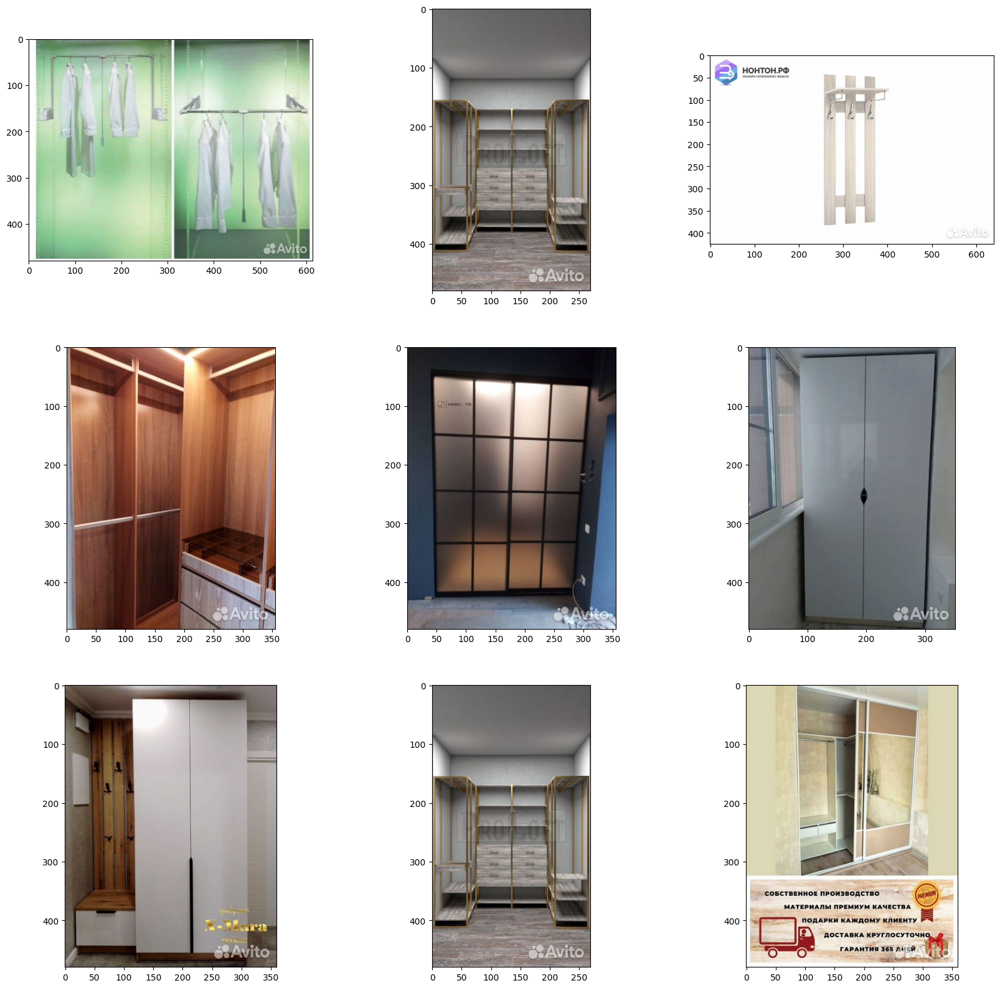

In [27]:
sample_df = dress_room_df.sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [28]:
sample_df[['title', 'description']]

,title,description
0,Пантограф lift 500,"Пантограф в рабочем состоянии, использовался редко. \nКроме естественных потёртости на хромированной трубе других повреждений нет"
1,Гардеробная система лофт,"😱 Гардеробная система лофт все еще по старой цене! Успей сделать заказ до новых поставок материала.Смотрите другие гардеробы, шкафы и гардеробные комнаты в стиле лофт из металла в нашем каталоге.\n \n📲 Расчет твоего индивидуального заказа за 3 часа. Посчитаем?\n \n✍️Напишите нам слово каталог и мы вышлем подборку мебели в стиле лофт сделанную специально для вас!\n \n💥НА ЗАКАЗ ВОЗМОЖНЫ ЛЮБЫЕ ГАБАРИТЫ, ЦВЕТА ФОРМЫ И МАТЕРИАЛЫ ДЛЯ ВАШЕЙ МЕБЕЛИ В СТИЛЕ ЛОФТ.\n \n🟡🔴⚫️ 25 цветов порошковой краски ..."
2,Панель-вешалка Лотос 12.011 шимо светлый,"Вешалка новая в наличии. В рассрочку за 582 р. в месяц! Оплата при получении.Скидка 70 рублей. Подробности на сайте НОНТОН---------------------------------------------------------Панель-вешалка Лотос 12.011 шимо светлый (арт. 08-59478)Еще 50 000 товаров по выгодным ценам, скидки и акции на официальном сайте НОНТОН.Введите НОНТОН в любой поисковой системе.---------------------------------------------------------Характеристики товара:арт.08-59478- Ширина: 60.2 см - Глубина: 22 см - Высота: 152..."
3,Гардероб на заказ,"Гардеробная на заказ, ИЗГОТОВЛЕНИЕ ОТ 5 ДНЕЙ! ВЫЗОВ ЗАМЕРЩИКА БЕСПЛАТНО! ГАРАНТИЯ 5 ЛЕТ! СВОЁ ПРОИЗВОДСТВО! БЕЗ ПОСРЕДНИКОВ.\n \n Гардеробная комната на заказ любых размеров и с наполнением по Вашему желанию.\n \n НАШИ ПРЕИМУЩЕСТВА:\n \n 🚀 ИЗГОТОВЛЕНИЕ от 5 дней\n \n ✏️Вызов замерщика БЕСПЛАТНЫЙ\n \n 🏭 Собственное ПРОИЗВОДСТВО\n \n ⚠️Гарантия 5 лет‼️!\n \n ✅Цены напрямую от производителя, БЕЗ ПОСРЕДНИКОВ\n \n ⚠️На рынке более 10 ЛЕТ.\n \n Делаем так же другие системы хранения, пишите, звонит..."
4,Двери купе для гардеробной новые,"🔥 Двери-купе для шкафа, ниши или гардеробной 🔥\n \n~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n 🔸ЛЮБЫЕ РАЗМЕРЫ НА ЗАКАЗ\n 👍 НАПРЯМУЮ ОТ ПРОИЗВОДИТЕЛЯ\n 🔸 Бесшумные ролики премиум класса\n 🔸 Возможен монтаж к натяжному и подвесному потолку\n ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n \nХАРАКТЕРИСТИКИ:\n \n🔸 Размер 2520*2972\n 🔸 ДВЕРИ: травмо-безопасное стекло БРОНЗА САТИНАТ\n 🔸 Алюминиевый профиль комбо ЧЕРНЫЙ (разные цвета)\n \n~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n \n💳 29228 руб - стоимос..."
5,"Шкаф купе, гардеробная","Шкаф-купе от производителя по низкой цене. Предоставляем РАССРОЧКУ. Наша мебельная компания mmsmebel занимается производством шкафов купе, кухонь, рабочих зон. Работаем без посредников. Гарантия на весь ассортимент. Бесплатная доставка прямо до двери.\n\n🔥 Звоните и заказывайте прямо сейчас, ЗАМЕР И ДИЗАЙН ПРОЕКТ АБСОЛЮТНО БЕСПЛАТНО!\n\nМы очень рады вашему обращению. Чтобы наше взаимодействие прошло намного продуктивнее и быстрее оставьте свой номер телефона.\n\nНапоминаем, при отправке ном..."
6,Гардеробная,"Р \n \n *****************\n Позвоните или напишите нам сообщение, чтобы получить БЕСПЛАТНЫЙ ЗАМЕР, 3Д дизайн проект и визуализацию будущей мебели при помощи VR очков В ПОДАРОК 🎁\n *****************\n \n Мы фабрика мебели X-Mara являемся одними из крупных производителей мебели на заказ в Краснодарском Крае! \n \n ❗ Наше особое преимущество - это ШВЕЙЦАРСКОЕ ОБОРУДОВАНИЕ, позволяющее производить мебель соответствующую вашим размерам С ТОЧНОСТЬЮ ДО МИЛЛИМЕТРА. А также фиксированные сроки изгото..."
7,Гардеробная система лофт,"😱 Гардеробная система лофт все еще по старой цене! Успей сделать заказ до новых поставок материала.Смотрите другие гардеробы, шкафы и гардеробные комнаты в стиле лофт из металла в нашем каталоге.\n \n📲 Расчет твоего индивидуального заказа за 3 часа. Посчитаем?\n \n✍️Напишите нам слово каталог и мы вышлем подборку мебели в стиле лофт сделанную специально для вас!\n \n💥НА ЗАКАЗ ВОЗМОЖНЫ ЛЮБЫЕ ГАБАРИТЫ, ЦВЕТА ФОРМЫ И МАТЕРИАЛЫ ДЛЯ ВАШЕЙ МЕБЕЛИ В СТИЛЕ ЛОФТ.\n \n🟡🔴⚫️ 25 цветов порошковой краски ..."
8,Гардеробная,"Шкаф купе на заказ без посредников и переплаты. Напрямую от ФАБРИКИ. СОБСТВЕННОЕ ПРОИЗВОДСТВО корпусной ме

## Регулярки

In [29]:
regexp1 = re.compile(r'.')

include_re = [regexp1]

not_regexp1 = re.compile(r'заказ')
not_regexp2 = re.compile(r'вешалк')
not_regexp3 = re.compile(r'вешало')

exclude_re = [not_regexp1, not_regexp2, not_regexp3]

In [30]:
dress_room_df = calculate_text_heuristics(dress_room_df, include_re, exclude_re=exclude_re)

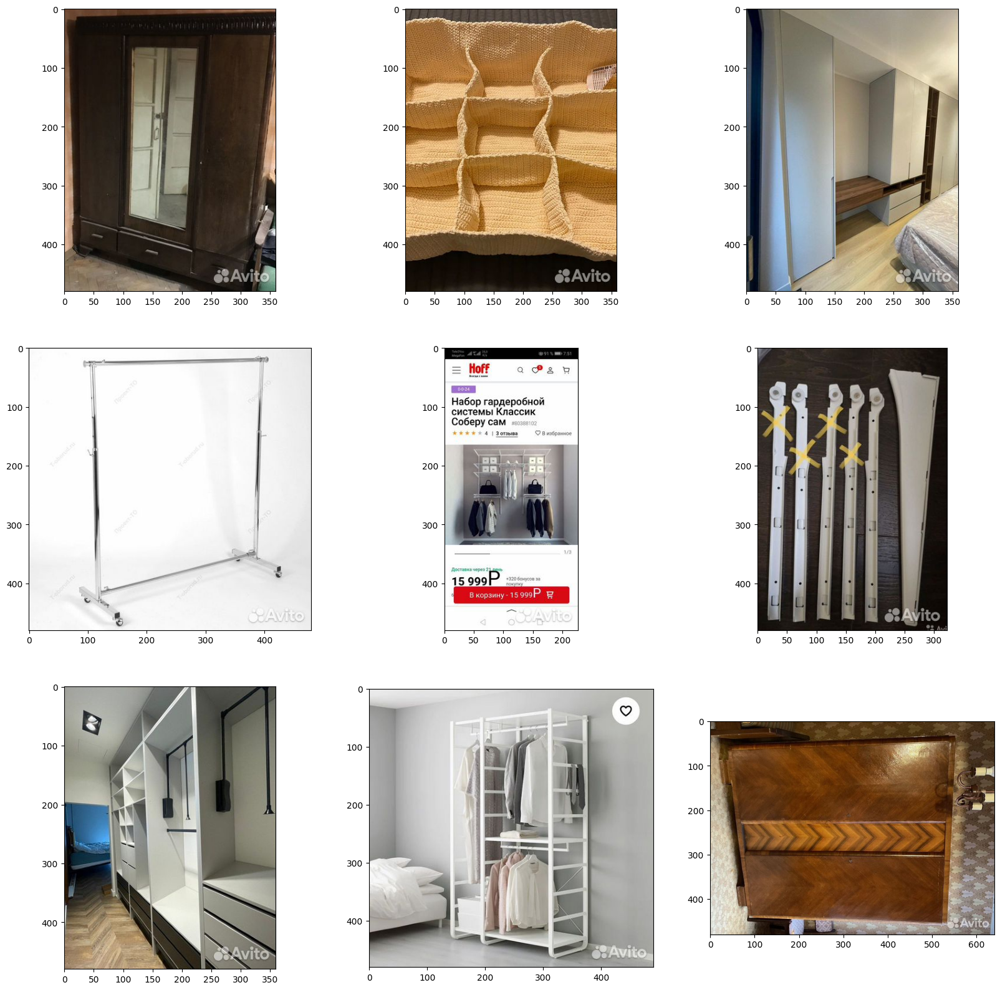

In [31]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [32]:
sample_df[['title', 'description']]

,title,description
0,"Шкаф для одежды ссср, ретро гардероб","Продаётся гардероб с зеркалом в хорошем состоянии. Очень добротный, натуральное дерево."
1,Органайзер для хранения вещей IKEA,Новый органайзер для хранения вещей ikea. Размеры 50х40х15 см. Можно стирать
2,Гардеробный шкаф дизайнерский,"DIZAINAZONA - это про стиль, качество и комфорт. Топовый производитель мебели полного цикла с Риги.\n \nИменно нам вы можете доверить:\n \n- прихожую, которая как визитная карточка, покажет ваш стиль\n \n- идеально встроенный шкаф или отдельно стоящий, как искусство\n \n- рабочее место, за которым всё удобно расположено под рукой\n \n- гардеробную мечты, где у каждой вещи будет своë место\n \n- детскую, из которой ребёнок не захочет выходить\n \nПроработаем дизайн, 3D-проект, подберем матери..."
3,Стойка для одежды,Продам стойку для одежды!
4,Гардеробная система Соберу сам классик,"Новая, повесили и сняли, не подошла по размерам, металл. Можно собрать варианты как хотите. \nПолки 36*92см-2 шт, 34*92-1 шт \n34*66-2 шт, 36*66-1 шт \n34*43,5-2 шт, 36*43,5-1 шт \nРельс 92 см-2 шт, 44 см-1 шт \nШтанга 92 см-1шт, 87см-2 шт, 86 см-1 шт\nКрючок 9,8*7,8*3 см-4 шт \nКрепёжные и соединительные элементы 7*3,2*1,4 см-4 шт \nЗаглушка 2,5*2,2*2,5 см-2 шт \nКронштейн 37,5*5,8*1,4 см-15 шт\nНаправляющие 92*2*2,3 см-8 шт \nМкр. Победа."
5,"IKEA альгот кронштейн, направляющие",Кронштейн 38 см 600р\nНаправляющая 38 см 200р
6,Гардеробная шкаф дизайнерский,"DIZAINAZONA - это про стиль, качество и комфорт. Топовый производитель мебели полного цикла с Риги.\n \nИменно нам вы можете доверить:\n \n- прихожую, которая как визитная карточка, покажет ваш стиль\n \n- идеально встроенный шкаф или отдельно стоящий, как искусство\n \n- рабочее место, за которым всё удобно расположено под рукой\n \n- гардеробную мечты, где у каждой вещи будет своë место\n \n- детскую, из которой ребёнок не захочет выходить\n \nПроработаем дизайн, 3D-проект, подберем матери..."
7,Elvarli IKEA комбинация для гардероба,Продам гардеробную комбинацию из стеллажей (шкафов) Элварли. Б/у очень мало. Куплена перед закрытием икеа в новую квартиру. Летом заменили на шкафы с дверями - Пакс. \n\nРазмеры этой комбинации 125х55х216. Качество и внешний Элварли вид заметно лучше всех остальных систем икеа. Мы дополнили комбинацию ящиком и полкой в узкой части секции (На фото скрины из икеа). \nРазобрана и готова к перевозке.
8,Винтажный шкаф гардероб,Крепкий винтажный шкаф гардероб


# Внешние данные - модели

## 1. Perform

In [33]:
dress_room_df[['image', 'perform_top_microcat_name', 'perform_top_microcat_prob', 
               'perform_top_other_classes_value', 'perform_top_other_classes_prob']]

,image,perform_top_microcat_name,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob
0,http://labelimages.avito.ru/15560973305.jpg,Для магазина,0.709483,Скриншоты переписок,0.006964
1,http://labelimages.avito.ru/9095886720.jpg,Для магазина,0.730528,Порнография,0.183122
2,http://labelimages.avito.ru/15560972592.jpg,Для магазина,0.862651,Скриншоты переписок,0.010626
3,http://labelimages.avito.ru/15560975623.jpg,Для магазина,0.827360,Порнография,0.007064
4,http://labelimages.avito.ru/15629461405.jpg,Для магазина,0.198021,Дети,0.027464
...,...,...,...,...,...
15145,http://labelimages.avito.ru/15941249740.jpg,Книги,0.185877,Свастика,0.046759
15146,http://labelimages.avito.ru/15941479187.jpg,Книги,0.185877,Свастика,0.046759
15147,http://labelimages.avito.ru/16038596428.jpg,Видеокамеры,0.062653,Ванная,0.027625
15148,http://labelimages.avito.ru/16038609701.jpg,Видеокамеры,0.121906,Скриншоты переписок,0.021699


In [34]:
dress_room_df['perform_top_microcat_name'].value_counts()[:10]

Шкафы, комоды и стеллажи      6641
Другое                        3395
Ресепшены и офисная мебель    1253
Для магазина                   825
Подставки и тумбы              376
Двери                          256
Наушники                       243
Детская мебель                 232
Потолки                        125
Кухонные гарнитуры             120
Name: perform_top_microcat_name, dtype: int64

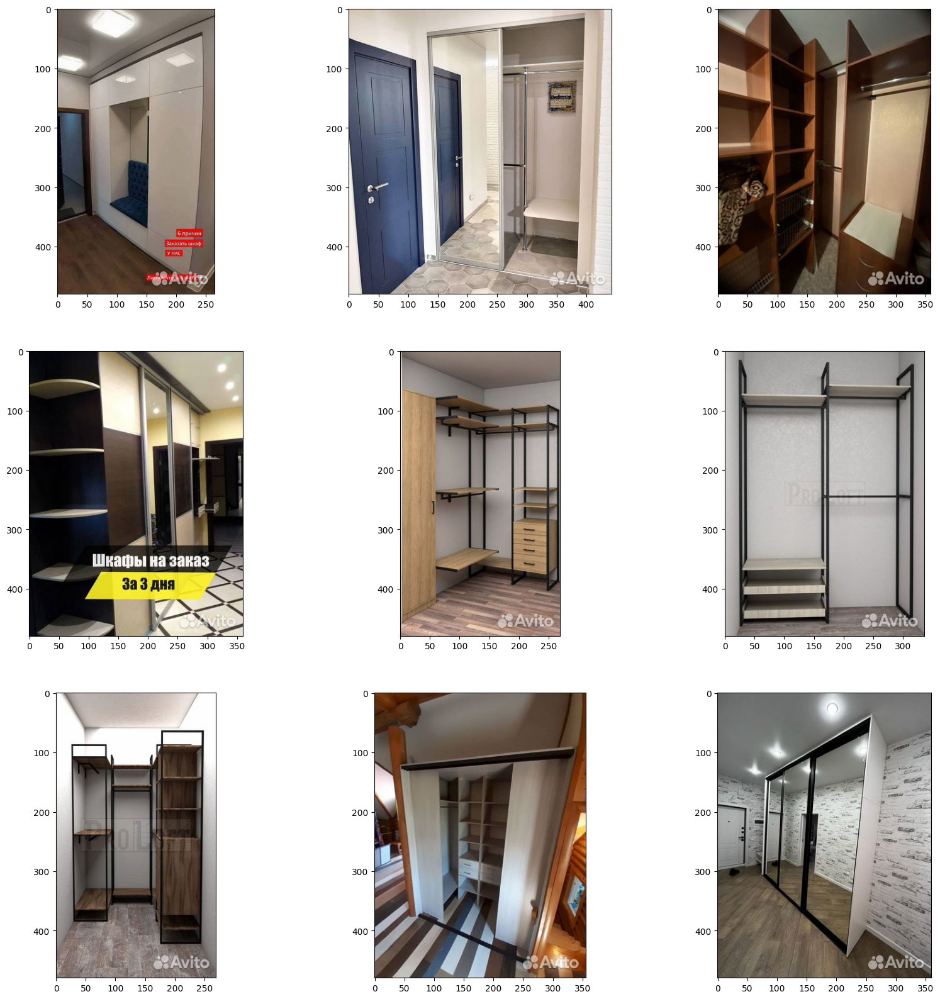

In [35]:
sample_df = dress_room_df[(dress_room_df['perform_top_microcat_name'] == 'Шкафы, комоды и стеллажи') & (
    dress_room_df['perform_top_microcat_prob'] >= 0.1)].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 2. Text detector 
Определяет область с текстом на картинке

Мы будем просто считать кол-во таких областей

In [36]:
dress_room_df['n_texts'].value_counts()

1     7644
0     3629
2      834
4      566
3      491
8      374
5      365
9      256
7      249
6      186
14     101
19      83
16      54
21      52
10      44
23      36
20      32
15      31
13      26
22      22
12      14
11      14
18      10
17       7
95       5
24       5
27       3
25       2
32       2
28       2
34       1
35       1
31       1
26       1
39       1
30       1
42       1
60       1
29       1
43       1
54       1
Name: n_texts, dtype: int64

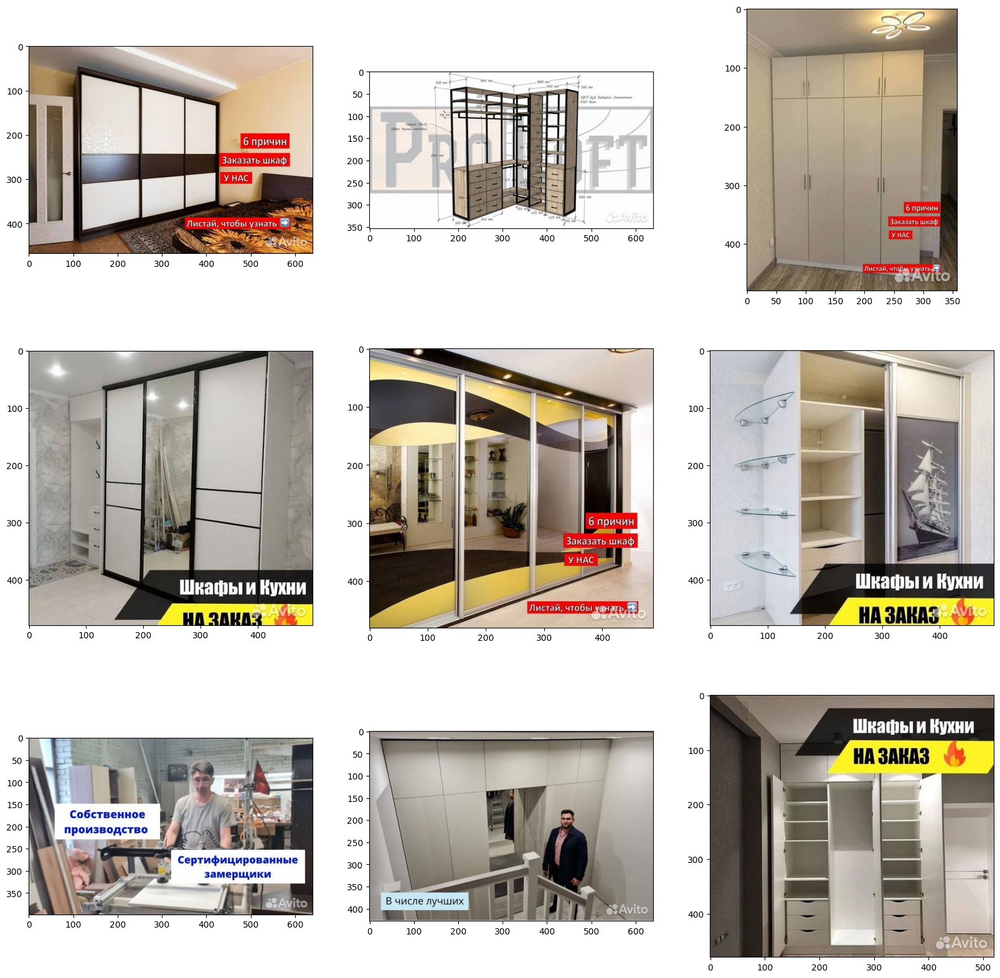

In [37]:
sample_df = dress_room_df[dress_room_df['n_texts'] >= 3].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 3. Smart crop

In [38]:
dress_room_df[['crop_coords', 'crop_area', 'is_catalog']]

,crop_coords,crop_area,is_catalog
0,"[0.1919984370470047, 0.0204620361328125, 0.9016428589820862, 0.98046875]",0.681263,False
1,"[0.27001953125, 0.025390625, 0.7099609375, 0.92578125]",0.396119,False
2,"[0.10186673700809479, 0.022796630859375, 0.8873000144958496, 0.9833984375]",0.754489,False
3,"[0.12142515182495117, 0.038665771484375, 0.9772687554359436, 0.87353515625]",0.714518,False
4,"[0.281494140625, 0.02766927145421505, 0.80615234375, 0.978515625]",0.498869,False
...,...,...,...
15145,"[0.349609375, 0.1044921875, 0.6259765625, 0.9129464626312256]",0.223430,True
15146,"[0.349609375, 0.1044921875, 0.6259765625, 0.9129464626312256]",0.223430,True
15147,"[0.14234213531017303, 0.0269775390625, 0.9417175054550171, 0.92041015625]",0.714188,False
15148,"[0.14446131885051727, 0.0284423828125, 0.9351022839546204, 0.93310546875]",0.715264,False


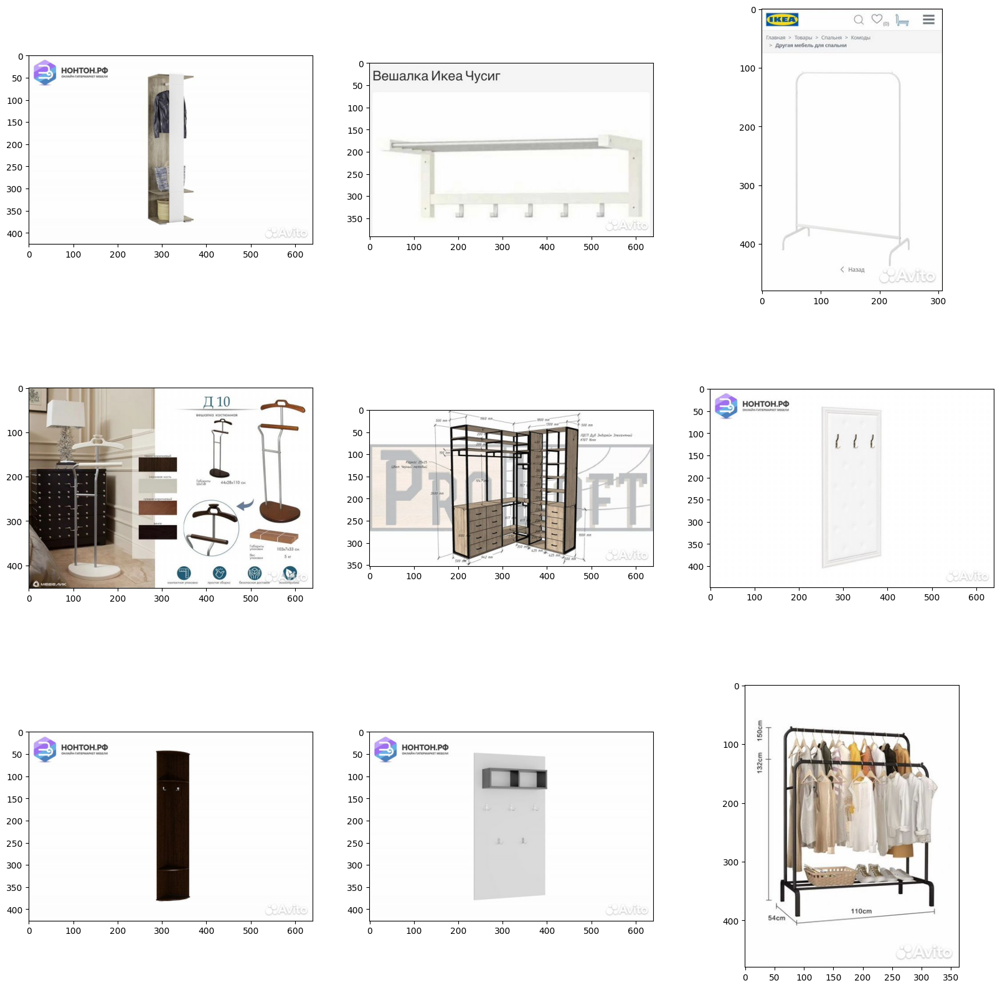

In [39]:
sample_df = dress_room_df[dress_room_df['is_catalog'] == True].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## Модель распознавания лиц

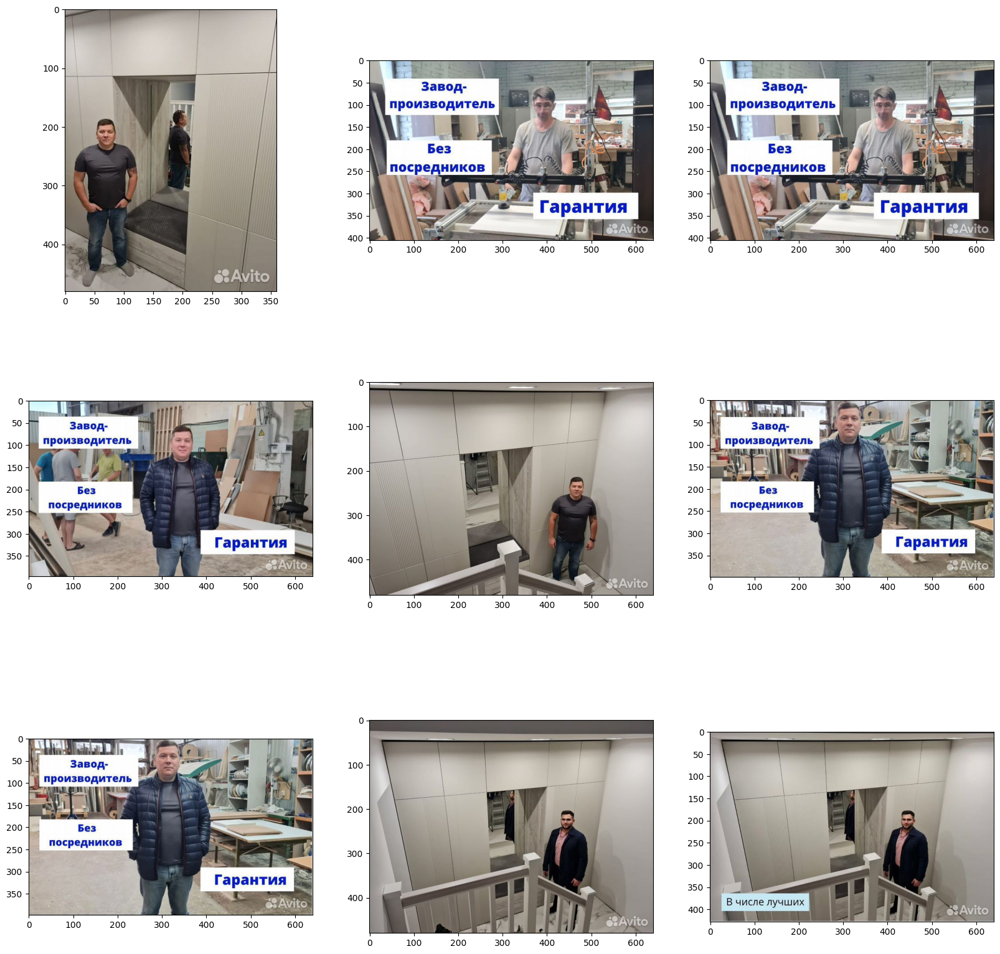

In [40]:
sample_df = dress_room_df[dress_room_df['person_found'] == True].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [41]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].shape

(1375, 19)

In [42]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)].shape

(1149, 19)

In [43]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        ) & (dress_room_df['person_found'] == False)].shape

(1134, 19)

In [46]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)
             ].to_csv('new_data/heur_dress_room.csv', index=False)

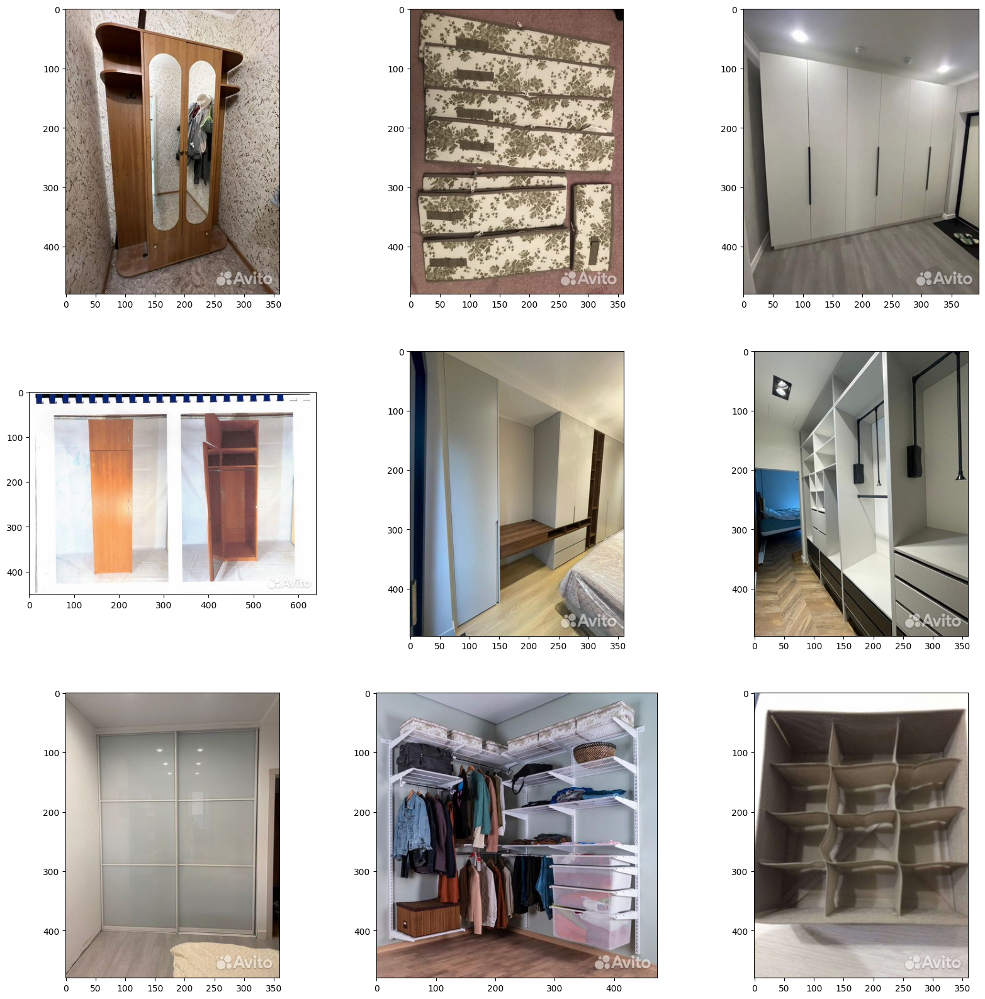

In [47]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        ) & (dress_room_df['person_found'] == False)].sample(9).reset_index()

plot_imgs_with_labels(sample_df['img_path'])